<a href="https://colab.research.google.com/github/firdyannnn/Deep-Learning-Lanjut/blob/main/Model_WGAN_GP_Pertemuan_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Install library kaggle
!pip install -q kaggle pandas

import os
import json # Added to parse kaggle.json

# Konfigurasi Kaggle (Pastikan kaggle.json sudah diupload)
kaggle_config_dir = '/root/.kaggle'
kaggle_json_path = os.path.join(kaggle_config_dir, 'kaggle.json')
source_kaggle_json = 'kaggle.json' # Assumes kaggle.json is in /content/

# Create .kaggle directory if it doesn't exist
if not os.path.exists(kaggle_config_dir):
    os.makedirs(kaggle_config_dir)

# Copy kaggle.json from /content/ to /root/.kaggle/ and set permissions
if os.path.exists(source_kaggle_json):
    print(f"Mengcopy {source_kaggle_json} ke {kaggle_config_dir}/")
    !cp {source_kaggle_json} {kaggle_config_dir}/
    !chmod 600 {kaggle_json_path}

    # Verify kaggle.json content
    if not os.path.exists(kaggle_json_path):
        print(f"Error: {kaggle_json_path} tidak ditemukan setelah disalin.")
    elif os.path.getsize(kaggle_json_path) == 0:
        print(f"Error: {kaggle_json_path} kosong. Pastikan file kaggle.json Anda berisi kredensial API yang valid.")
    else:
        try:
            with open(kaggle_json_path, 'r') as f:
                config = json.load(f)
            if 'username' not in config or 'key' not in config:
                print(f"Error: {kaggle_json_path} tidak memiliki 'username' atau 'key'. Harap periksa isinya.")
            else:
                print("Kaggle configuration successful.")
        except json.JSONDecodeError:
            print(f"Error: {kaggle_json_path} bukan file JSON yang valid. Harap periksa isinya.")
        except Exception as e:
            print(f"Terjadi kesalahan saat memeriksa {kaggle_json_path}: {e}")
else:
    print(f"Error: {source_kaggle_json} tidak ditemukan di direktori saat ini ({os.getcwd()}). Harap unggah file kaggle.json Anda.")

# Download Dataset CelebA (jika belum ada)
if not os.path.exists('img_align_celeba'):
    print("Mendownload dataset CelebA...")
    !kaggle datasets download -d jessicali9530/celeba-dataset
    print("Mengekstrak dataset...")
    # This command will only succeed if celeba-dataset.zip was downloaded
    !unzip -q celeba-dataset.zip
    print("Selesai!")
else:
    print("Dataset sudah ada.")

Mengcopy kaggle.json ke /root/.kaggle/
Kaggle configuration successful.
Mendownload dataset CelebA...
Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 99% 1.31G/1.33G [00:18<00:00, 124MB/s]
100% 1.33G/1.33G [00:18<00:00, 78.6MB/s]
Mengekstrak dataset...
Selesai!


In [2]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers
import matplotlib.pyplot as plt

# --- KONFIGURASI ---
BATCH_SIZE = 64 # Turunkan jika OOM (Out of Memory)
IMG_SHAPE = (64, 64, 3)
LATENT_DIM = 128
NUM_CLASSES = 2 # Binary: Male vs Female (atau atribut lain)
EPOCHS = 20     # Sesuaikan dengan waktu Anda (WGAN butuh waktu lama)

# --- 1. DATA LOADING CELEBA ---
print("Meniapkan Data Pipeline...")

# Baca atribut
attr_df = pd.read_csv("list_attr_celeba.csv")
# Kita ambil atribut 'Male' sebagai target label (-1: Female, 1: Male)
# Ubah label -1 menjadi 0 agar formatnya [0, 1]
attr_df['label'] = (attr_df['Male'] + 1) // 2
attr_df = attr_df[['image_id', 'label']]

# Ambil path gambar
base_path = "img_align_celeba/img_align_celeba/"
image_paths = [os.path.join(base_path, fname) for fname in attr_df['image_id']]
labels = attr_df['label'].values

# Untuk demo praktikum, kita ambil sebagian data saja (misal 30.000) agar cepat
# Hapus [:30000] jika ingin menggunakan seluruh dataset (200k gambar)
data_limit = 30000
image_paths = image_paths[:data_limit]
labels = labels[:data_limit]

# Fungsi Preprocessing
def load_and_preprocess(img_path, label):
    # Baca file gambar
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    # Resize & Crop Center (agar wajah proporsional)
    img = tf.image.resize(img, [64, 64])
    # Normalize ke [-1, 1]
    img = tf.cast(img, tf.float32) / 127.5 - 1.0
    return img, label

# Buat tf.data.Dataset
dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
dataset = dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.shuffle(buffer_size=1000).batch(BATCH_SIZE, drop_remainder=True).prefetch(tf.data.AUTOTUNE)

print(f"Dataset siap. Jumlah batch: {len(dataset)}")

Meniapkan Data Pipeline...
Dataset siap. Jumlah batch: 468


In [3]:
# --- 2. BUILD CRITIC (DISCRIMINATOR) ---
def build_critic(image_shape, num_classes):
    # Input Gambar
    img_input = layers.Input(shape=image_shape)

    # Input Label (Embedding -> Spasial)
    label_input = layers.Input(shape=(1,))
    # Embed label ke dimensi spasial (64x64)
    label_embedding = layers.Embedding(num_classes, image_shape[0]*image_shape[1])(label_input)
    label_embedding = layers.Reshape((image_shape[0], image_shape[1], 1))(label_embedding)

    # Gabungkan (Concatenate) Gambar + Label
    merged = layers.Concatenate(axis=-1)([img_input, label_embedding])

    # Arsitektur Konvolusi
    x = layers.Conv2D(64, 4, strides=2, padding="same")(merged)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(128, 4, strides=2, padding="same")(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(256, 4, strides=2, padding="same")(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(512, 4, strides=2, padding="same")(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Flatten()(x)
    output = layers.Dense(1)(x) # Output Linear (Score) untuk WGAN

    return models.Model([img_input, label_input], output, name="Critic")

# --- 3. BUILD GENERATOR ---
def build_generator(latent_dim, num_classes):
    # Input Noise
    z_input = layers.Input(shape=(latent_dim,))

    # Input Label
    label_input = layers.Input(shape=(1,))
    label_embedding = layers.Embedding(num_classes, latent_dim)(label_input)
    label_embedding = layers.Flatten()(label_embedding)

    # Gabungkan Noise + Label
    merged = layers.Concatenate()([z_input, label_embedding])

    # Upsampling
    x = layers.Dense(4 * 4 * 512)(merged)
    x = layers.Reshape((4, 4, 512))(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(256, 4, strides=2, padding="same")(x) # 8x8
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(128, 4, strides=2, padding="same")(x) # 16x16
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, 4, strides=2, padding="same")(x) # 32x32
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Output Layer (64x64x3) -> Tanh activation
    output = layers.Conv2DTranspose(3, 4, strides=2, padding="same", activation="tanh")(x)

    return models.Model([z_input, label_input], output, name="Generator")

In [4]:
# --- 4. GRADIENT PENALTY ---
def gradient_penalty(batch_size, real_images, fake_images, labels, critic):
    alpha = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)
    diff = fake_images - real_images
    interpolated = real_images + alpha * diff

    with tf.GradientTape() as gp_tape:
        gp_tape.watch(interpolated)
        # Critic menerima [gambar, label]
        pred = critic([interpolated, labels], training=True)

    grads = gp_tape.gradient(pred, [interpolated])[0]
    norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
    gp = tf.reduce_mean((norm - 1.0) ** 2)
    return gp

# --- 5. MODEL WGAN-GP UTAMA ---
class WGAN_GP_CGAN(keras.Model):
    def __init__(self, generator, critic, latent_dim, gp_weight=10.0):
        super().__init__()
        self.generator = generator
        self.critic = critic
        self.latent_dim = latent_dim
        self.gp_weight = gp_weight

        # Trackers
        self.c_loss_tracker = keras.metrics.Mean(name="c_loss")
        self.g_loss_tracker = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.c_loss_tracker, self.g_loss_tracker]

    def compile(self, c_optimizer, g_optimizer):
        super().compile()
        self.c_optimizer = c_optimizer
        self.g_optimizer = g_optimizer

    def train_step(self, data):
        # Unpack data (Image, Label) dari dataset
        real_images, labels = data

        batch_size = tf.shape(real_images)[0]

        # ---------------------
        #  Latih Critic (5x)
        # ---------------------
        for _ in range(5):
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

            with tf.GradientTape() as tape:
                # Generate Gambar Palsu (conditioned on labels)
                fake_images = self.generator([random_latent_vectors, labels], training=True)

                # Prediksi Critic
                real_logits = self.critic([real_images, labels], training=True)
                fake_logits = self.critic([fake_images, labels], training=True)

                # Wasserstein Loss
                c_wass_loss = tf.reduce_mean(fake_logits) - tf.reduce_mean(real_logits)

                # Gradient Penalty
                c_gp = gradient_penalty(batch_size, real_images, fake_images, labels, self.critic)

                # Total Critic Loss
                c_loss = c_wass_loss + self.gp_weight * c_gp

            # Update Critic
            c_grads = tape.gradient(c_loss, self.critic.trainable_variables)
            self.c_optimizer.apply_gradients(zip(c_grads, self.critic.trainable_variables))

        # ---------------------
        #  Latih Generator (1x)
        # ---------------------
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        with tf.GradientTape() as tape:
            fake_images = self.generator([random_latent_vectors, labels], training=True)
            fake_logits = self.critic([fake_images, labels], training=True)

            # Generator Loss (maximize critic prediction for fake)
            g_loss = -tf.reduce_mean(fake_logits)

        # Update Generator
        g_grads = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(g_grads, self.generator.trainable_variables))

        # Update Metrics
        self.c_loss_tracker.update_state(c_loss)
        self.g_loss_tracker.update_state(g_loss)

        return {
            "c_loss": self.c_loss_tracker.result(),
            "g_loss": self.g_loss_tracker.result(),
        }

Mulai Training...
Epoch 1/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step - c_loss: -49.2257 - g_loss: -68.8144

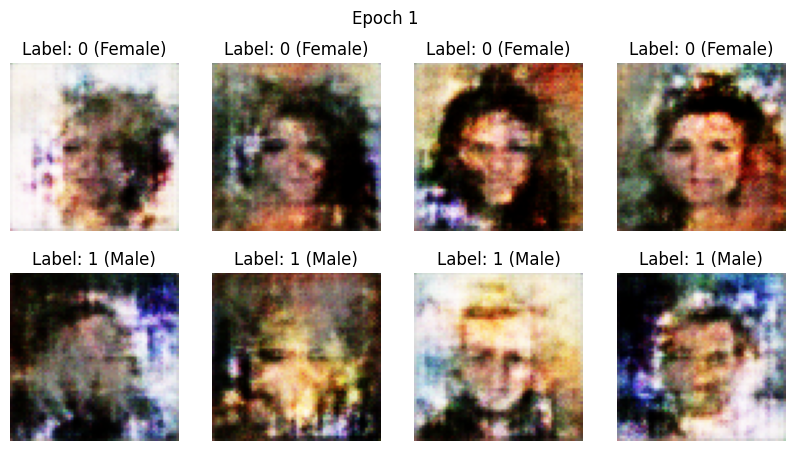

468/468 ━━━━━━━━━━━━━━━━━━━━ 217s 370ms/step - c_loss: -49.1851 - g_loss: -68.8765
Epoch 2/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - c_loss: -15.4210 - g_loss: -46.1415

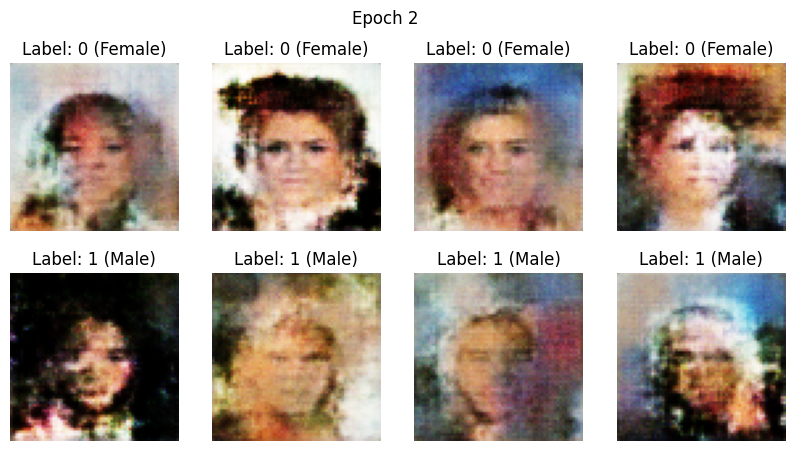

468/468 ━━━━━━━━━━━━━━━━━━━━ 180s 384ms/step - c_loss: -15.4190 - g_loss: -46.1253
Epoch 3/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -13.3608 - g_loss: -22.4921

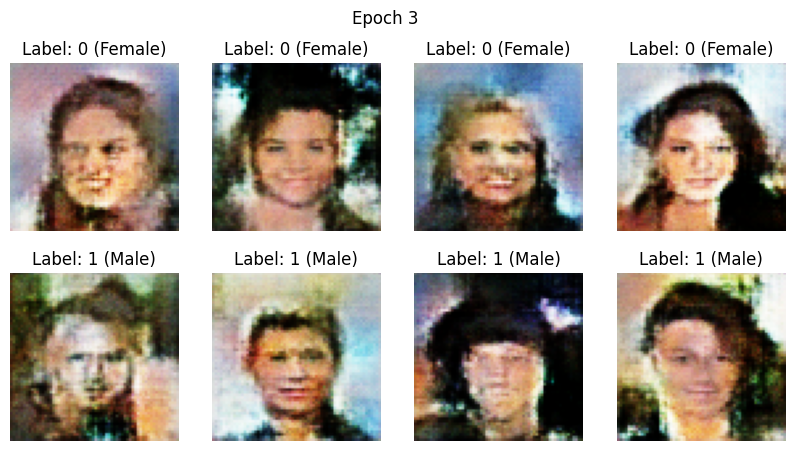

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 385ms/step - c_loss: -13.3603 - g_loss: -22.4816
Epoch 4/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -12.6892 - g_loss: -4.7745

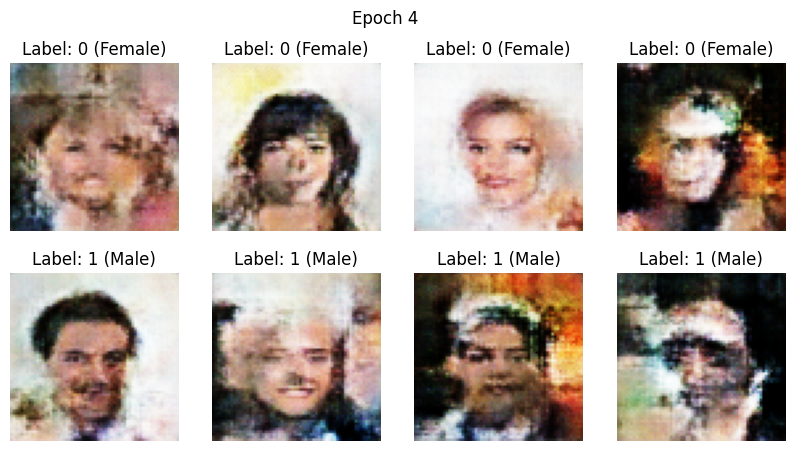

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 386ms/step - c_loss: -12.6888 - g_loss: -4.7711
Epoch 5/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -11.7901 - g_loss: -0.2958

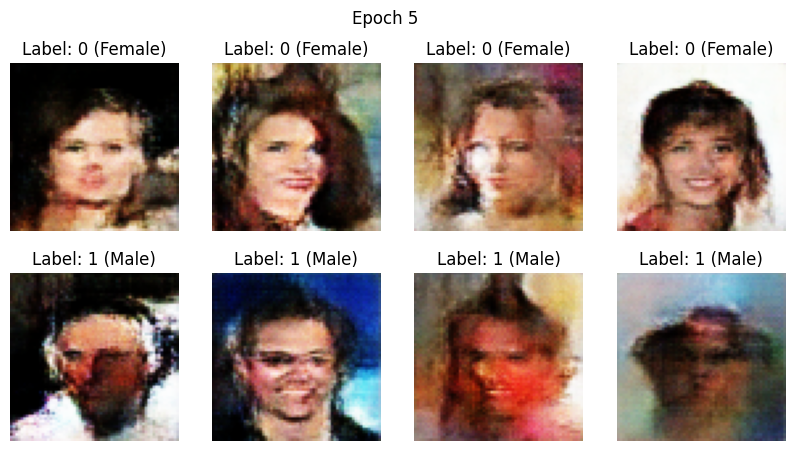

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 385ms/step - c_loss: -11.7901 - g_loss: -0.2939
Epoch 6/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -11.3334 - g_loss: 2.5997

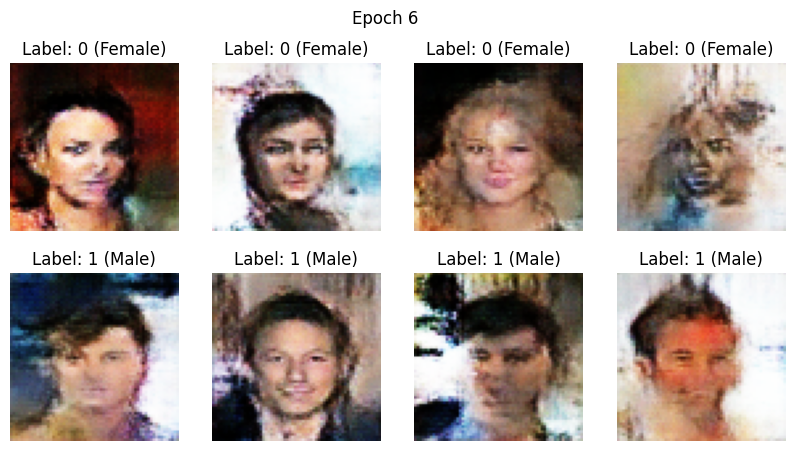

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 385ms/step - c_loss: -11.3330 - g_loss: 2.6016
Epoch 7/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -10.6664 - g_loss: 3.8864

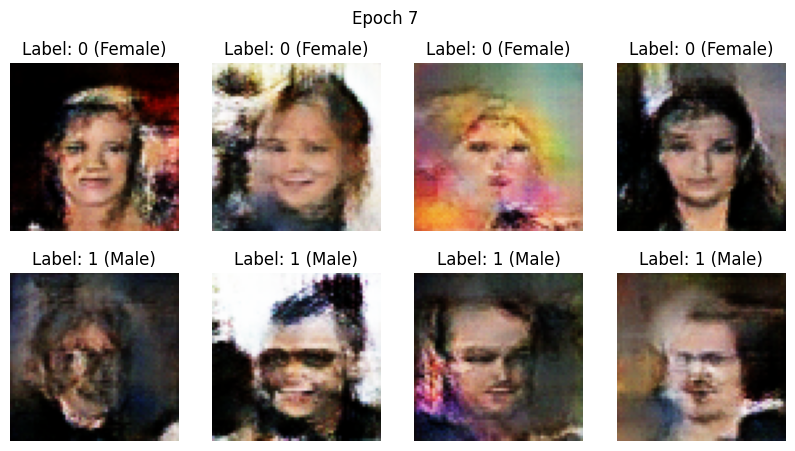

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 385ms/step - c_loss: -10.6664 - g_loss: 3.8867
Epoch 8/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -10.2902 - g_loss: 4.6329

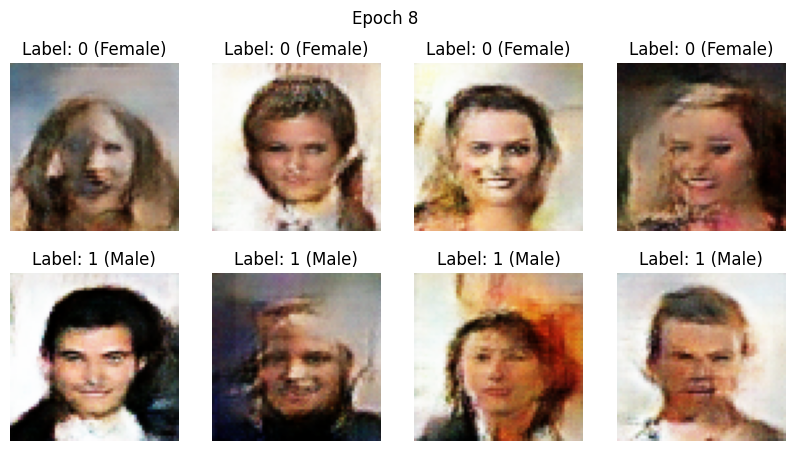

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 385ms/step - c_loss: -10.2902 - g_loss: 4.6339
Epoch 9/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -9.9579 - g_loss: 6.7287

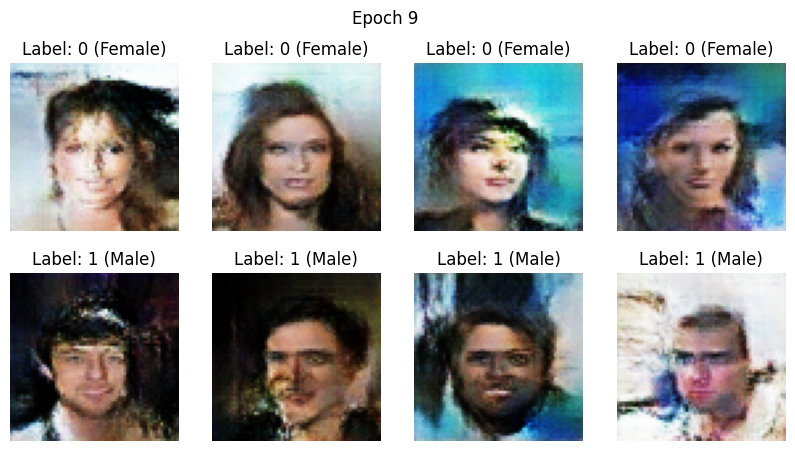

468/468 ━━━━━━━━━━━━━━━━━━━━ 180s 385ms/step - c_loss: -9.9579 - g_loss: 6.7279
Epoch 10/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -9.7366 - g_loss: 5.2060

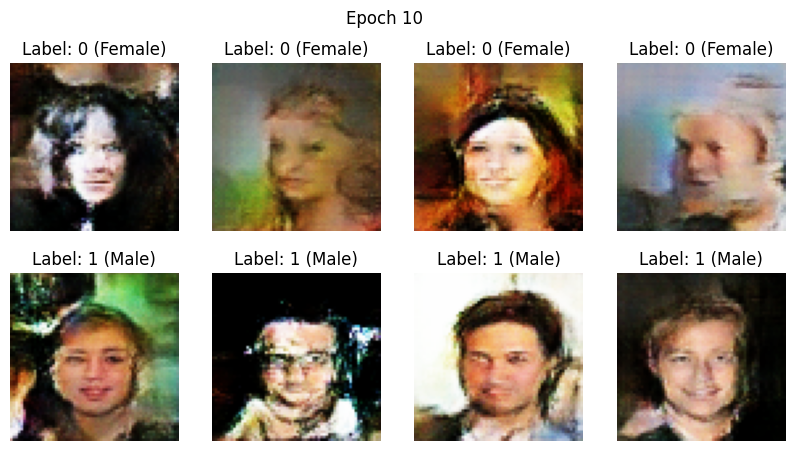

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 385ms/step - c_loss: -9.7364 - g_loss: 5.2056
Epoch 11/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -9.4313 - g_loss: 1.8391

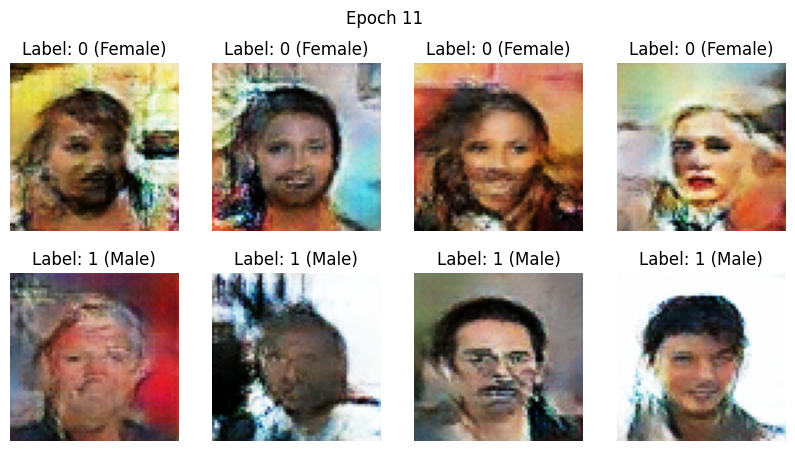

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 385ms/step - c_loss: -9.4310 - g_loss: 1.8425
Epoch 12/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -9.0558 - g_loss: 0.3170

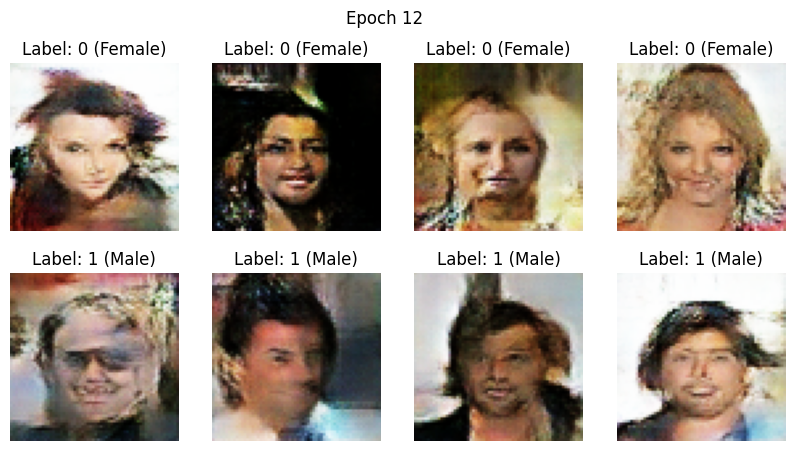

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 385ms/step - c_loss: -9.0559 - g_loss: 0.3227
Epoch 13/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -8.8866 - g_loss: 4.8092

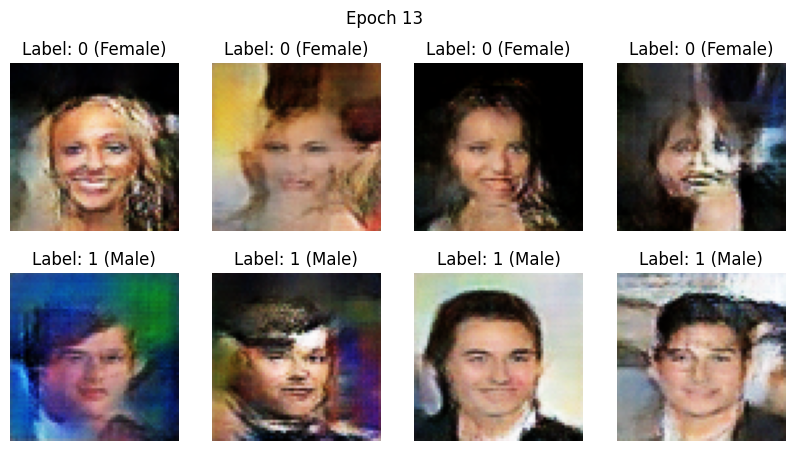

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 385ms/step - c_loss: -8.8866 - g_loss: 4.8144
Epoch 14/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -8.5717 - g_loss: 8.5106

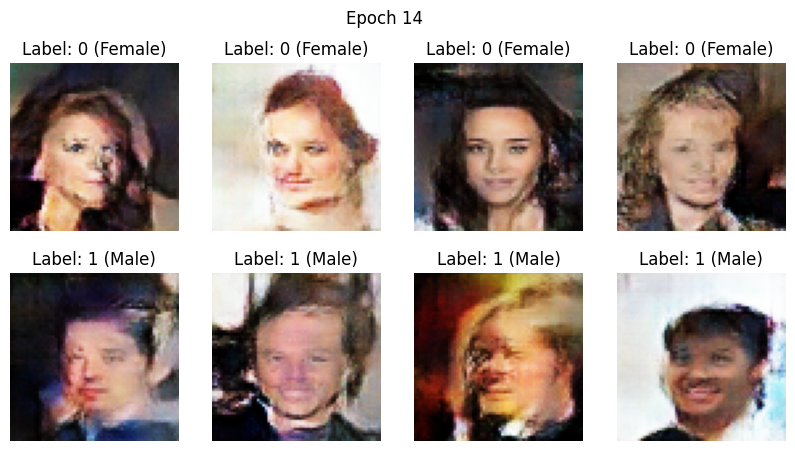

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 386ms/step - c_loss: -8.5716 - g_loss: 8.5095
Epoch 15/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -8.3224 - g_loss: 6.3470

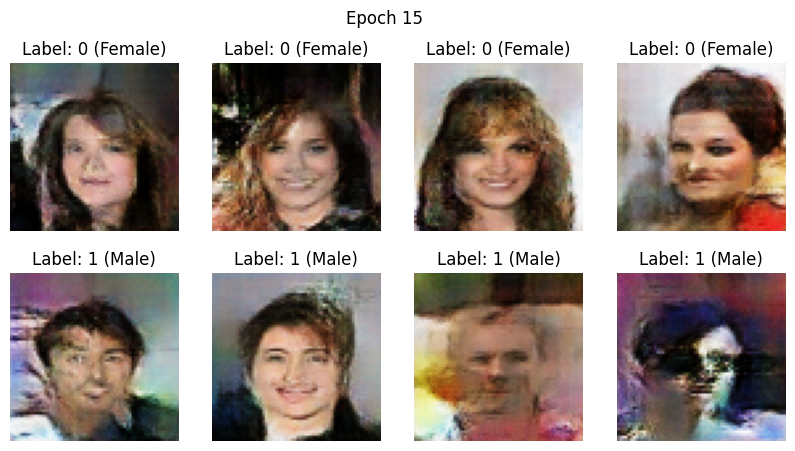

468/468 ━━━━━━━━━━━━━━━━━━━━ 180s 385ms/step - c_loss: -8.3225 - g_loss: 6.3476
Epoch 16/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -8.2889 - g_loss: 10.2473

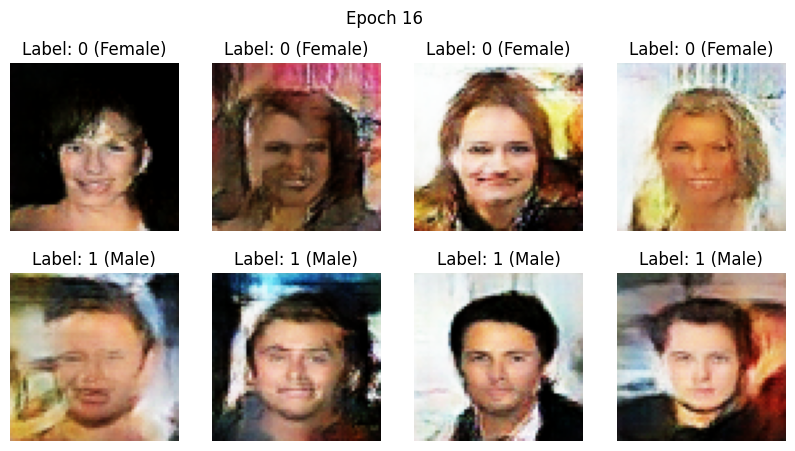

468/468 ━━━━━━━━━━━━━━━━━━━━ 180s 385ms/step - c_loss: -8.2888 - g_loss: 10.2434
Epoch 17/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -8.0086 - g_loss: 9.0876

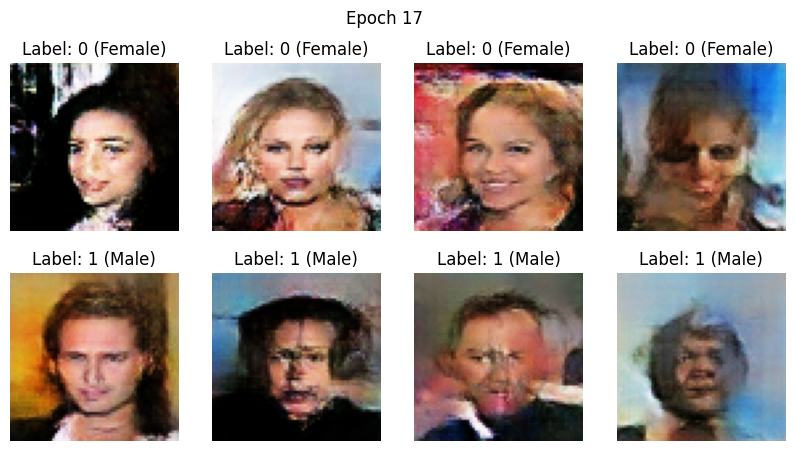

468/468 ━━━━━━━━━━━━━━━━━━━━ 181s 386ms/step - c_loss: -8.0087 - g_loss: 9.0902
Epoch 18/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - c_loss: -7.8252 - g_loss: 10.3145

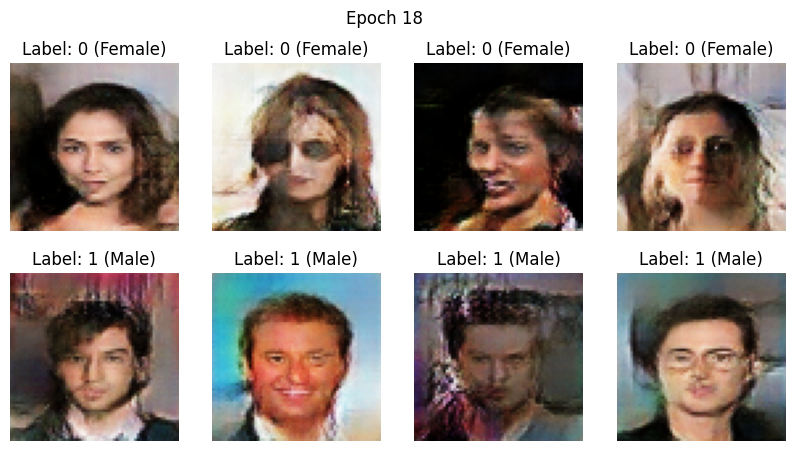

468/468 ━━━━━━━━━━━━━━━━━━━━ 201s 384ms/step - c_loss: -7.8251 - g_loss: 10.3154
Epoch 19/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - c_loss: -7.4894 - g_loss: 11.1557

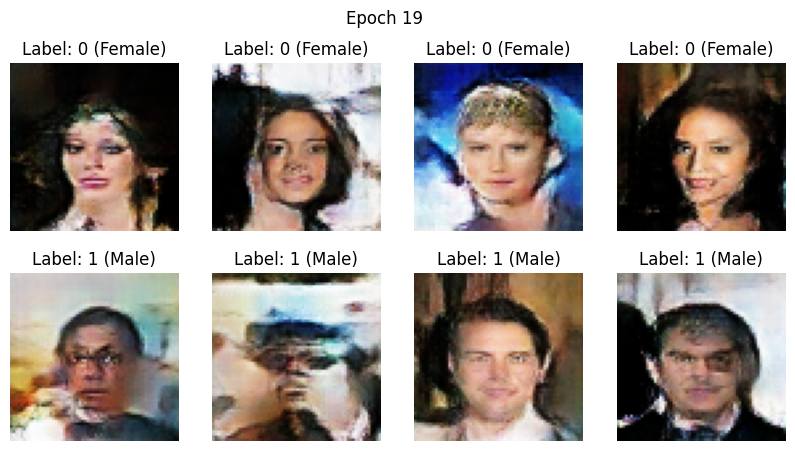

468/468 ━━━━━━━━━━━━━━━━━━━━ 180s 385ms/step - c_loss: -7.4895 - g_loss: 11.1550
Epoch 20/20
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - c_loss: -7.2420 - g_loss: 11.2665

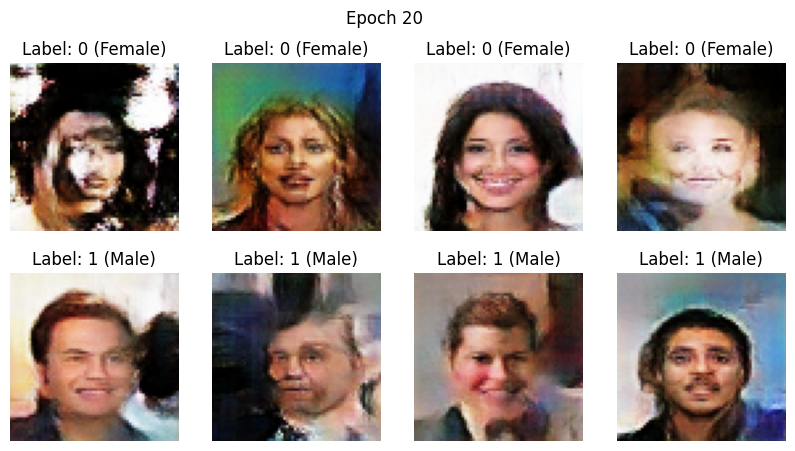

468/468 ━━━━━━━━━━━━━━━━━━━━ 180s 384ms/step - c_loss: -7.2421 - g_loss: 11.2713


In [5]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers
import matplotlib.pyplot as plt

# --- 6. CALLBACK MONITORING ---
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=4, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        # Kita generate 4 gambar Wanita (label 0) dan 4 gambar Pria (label 1)
        latent = tf.random.normal(shape=(self.num_img * 2, self.latent_dim))

        # Label: [0, 0, 0, 0, 1, 1, 1, 1]
        labels = np.array([0] * self.num_img + [1] * self.num_img)
        labels = labels.reshape(-1, 1)
        # Convert labels to a TensorFlow tensor
        labels = tf.convert_to_tensor(labels, dtype=tf.int32)

        generated_images = self.model.generator([latent, labels])
        generated_images = (generated_images * 127.5 + 127.5).numpy() # Un-normalize

        fig = plt.figure(figsize=(10, 5))
        for i in range(self.num_img * 2):
            plt.subplot(2, self.num_img, i + 1)
            img = generated_images[i].astype("uint8")
            plt.imshow(img)
            plt.axis("off")
            if i < self.num_img:
                plt.title("Label: 0 (Female)")
            else:
                plt.title("Label: 1 (Male)")

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show()

# --- 7. INISIALISASI & TRAIN ---
generator = build_generator(LATENT_DIM, NUM_CLASSES)
critic = build_critic(IMG_SHAPE, NUM_CLASSES)

wgan = WGAN_GP_CGAN(generator=generator, critic=critic, latent_dim=LATENT_DIM)

# Optimizer WGAN biasanya butuh beta_1=0.5, beta_2=0.9
wgan.compile(
    c_optimizer=optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9),
    g_optimizer=optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9)
)

print("Mulai Training...")
wgan.fit(
    dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=4, latent_dim=LATENT_DIM)]
)